# Pet adoption speed project

In this project, we build a deep learning model that predicts the adoption speed of a pet using both structured data (CSV features) and unstructured data (images).


## Importing the data and filling missing values

In [1]:
# Clone git repo
!git clone https://github.com/MilanBojic1999/RAF-PetFinder-dataset.git


fatal: destination path 'RAF-PetFinder-dataset' already exists and is not an empty directory.


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [3]:
df = pd.read_csv("RAF-PetFinder-dataset/Data/train.csv")
df_sentiment = pd.read_csv("RAF-PetFinder-dataset/Data/train_sentiment.csv")

In [ ]:
df.shape, df_sentiment.shape

((14993, 24), (14442, 3))

In [4]:
# Add the sentiment score and magnitude score to the main df
df = df.merge(df_sentiment, on="PetID", how="left")

# Add the target at the enbd
cols = [c for c in df.columns if c != "AdoptionSpeed"] + ["AdoptionSpeed"]
df = df[cols]


df.head()

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,SentimentScore,SentimentMagnitude,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,...,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,0.3,2.4,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,...,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,-0.2,0.7,0
2,1,Brisco,1,307,0,1,2,7,0,2,...,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,0.2,3.7,3
3,1,Miko,4,307,0,2,1,2,0,2,...,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,0.9,0.9,2
4,1,Hunter,1,307,0,1,1,0,0,2,...,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,0.6,3.7,2


In [ ]:
df.isna().sum()

,0
Type,0
Name,1265
Age,0
Breed1,0
Breed2,0
Gender,0
Color1,0
Color2,0
Color3,0
MaturitySize,0


In [5]:
# Fill missing values

df["SentimentScore"] = df["SentimentScore"].fillna(df["SentimentScore"].median())
df["SentimentMagnitude"] = df["SentimentMagnitude"].fillna(df["SentimentMagnitude"].median())

df.isna().sum()

,0
Type,0
Name,1265
Age,0
Breed1,0
Breed2,0
Gender,0
Color1,0
Color2,0
Color3,0
MaturitySize,0


## Analizing the csv data



### Distribution between the classes (labels, aka Y)

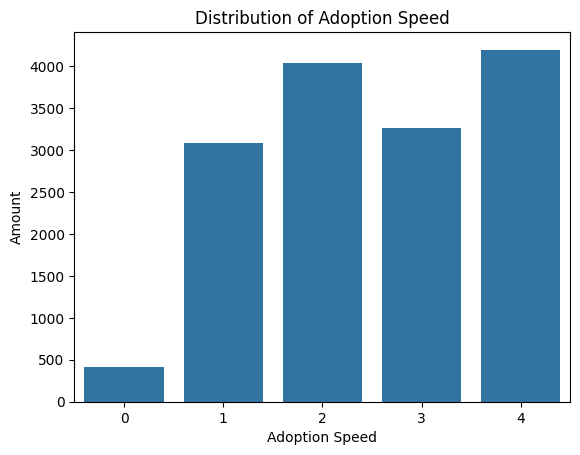

In [ ]:
# Lets see the adoption distribution of total pets

sns.countplot(
    data=df,
    x="AdoptionSpeed"
)

plt.title("Distribution of Adoption Speed")
plt.xlabel("Adoption Speed")
plt.ylabel("Amount")
plt.xticks(rotation=0)
plt.show()


### Class imbalance

As we can see from the plot there is a significant class imbalance, the class 0 is extremely under-represented

### Compare the adoption speed for cats and dogs

In [ ]:
df.Type.value_counts()

,count
Type,
1,8132
2,6861


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

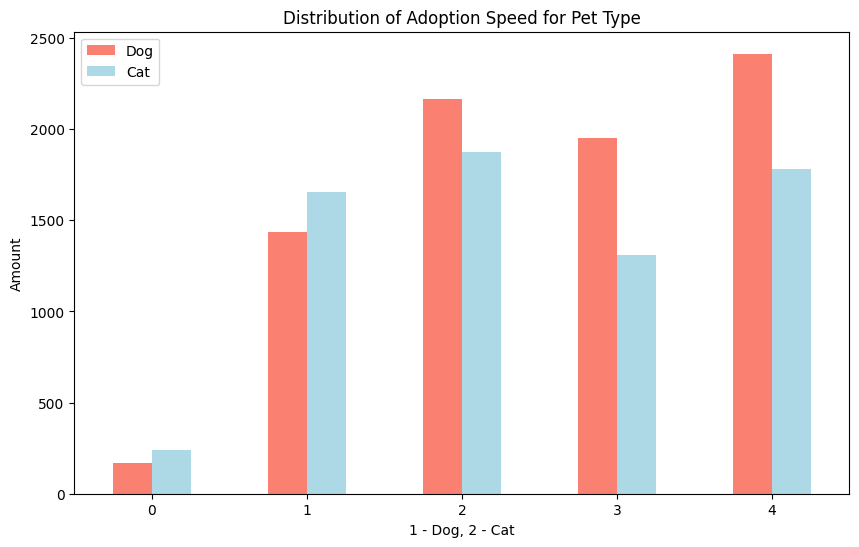

In [ ]:
pd.crosstab(df.AdoptionSpeed, df.Type).plot(kind="bar",
                                            figsize=(10, 6),
                                            color=["salmon", "lightblue"])

plt.title("Distribution of Adoption Speed for Pet Type")
plt.xlabel("1 - Dog, 2 - Cat")
plt.ylabel("Amount")
plt.legend(["Dog", "Cat"])
plt.xticks(rotation=0)

In [ ]:
df.Fee.value_counts()

,count
Fee,
0,12663
50,468
100,408
200,219
150,162
...,...
330,1
499,1
320,1


In [ ]:
# Age and health
# Vaccinated and sterilized
# Fee

### Check how Sentiment Score and Sentiment Magnitude affect the Adoption Speed

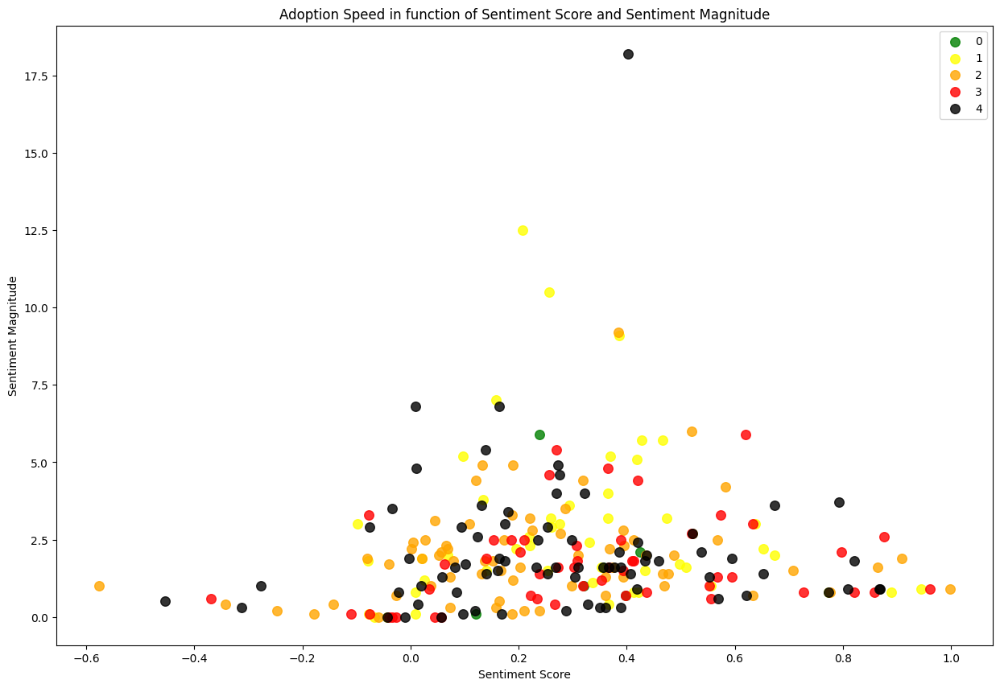

In [ ]:
plt.figure(figsize=(15, 10))

colors_map = {
    0: "green",
    1: "yellow",
    2: "orange",
    3: "red",
    4: "black"
}

sample = df.sample(frac=1)[:250]
jitter_strength = 0.1
jitter = np.random.uniform(-jitter_strength, jitter_strength, size=sample.shape[0])

scatter_handles = []  # to store scatter objects for legend

for as_value in sorted(df.AdoptionSpeed.unique()):
    subset = sample[sample.AdoptionSpeed == as_value]
    sc = plt.scatter(subset.SentimentScore + jitter[:len(subset)],
                     subset.SentimentMagnitude,
                     color=colors_map[as_value],
                     s=70,
                     alpha=0.8)
    scatter_handles.append(sc)

plt.title("Adoption Speed in function of Sentiment Score and Sentiment Magnitude")
plt.xlabel("Sentiment Score")
plt.ylabel("Sentiment Magnitude")
plt.legend(scatter_handles, [str(i) for i in sorted(df.AdoptionSpeed.unique())])
plt.show()


### Corelation matrix shows us how strongly each pair or numerical variables is related, +1 perfect positive relationship (as X increases so does Y), 0 no relationship, -1 perfect negative relationship (as X increases, Y decreases)

In [ ]:
df.dtypes

,0
Type,int64
Name,object
Age,int64
Breed1,int64
Breed2,int64
Gender,int64
Color1,int64
Color2,int64
Color3,int64
MaturitySize,int64


(22.5, -0.5)

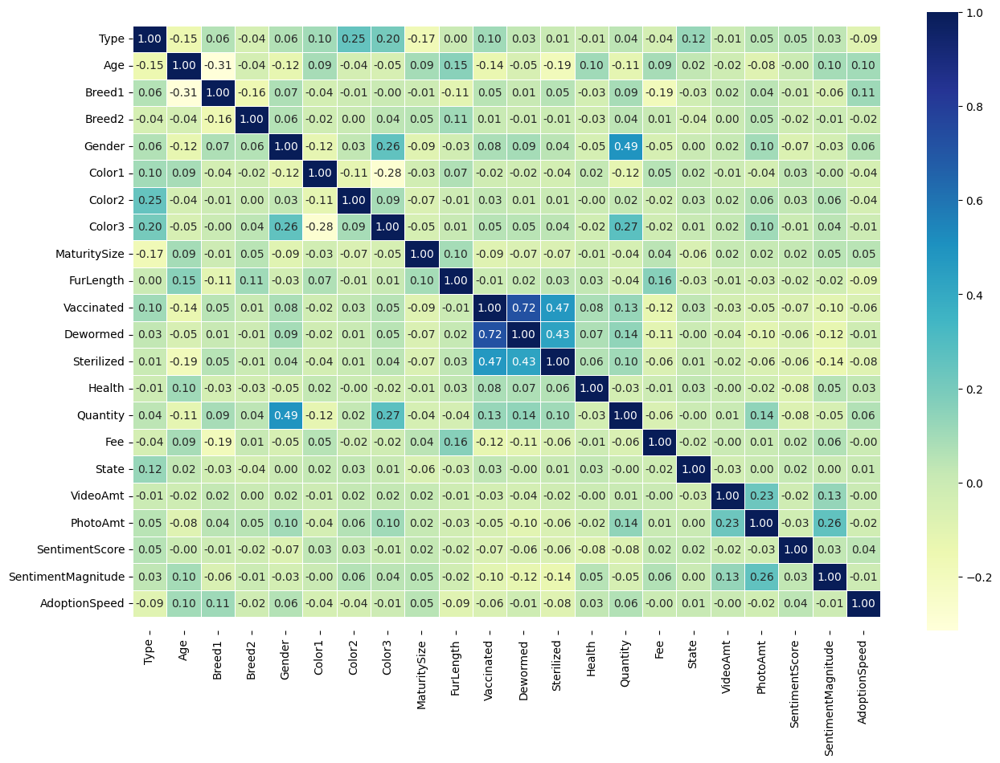

In [ ]:
# Display the correlation matrix
df_numeric = df.select_dtypes(include=['number'])
corr_matrix = df_numeric.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)


We can see that the Vaccinated, Dewormed and Sterilized columns are related, which particularly Vaccinated and Dewormed.

There is also a relationship betweeen Gender and Quantity, thats because Gender with the value of 3 means there are more than one pet in a single profile

In [ ]:
df.Gender.value_counts(), df.Quantity.value_counts()

(Gender
 2    7277
 1    5536
 3    2180
 Name: count, dtype: int64,
 Quantity
 1     11565
 2      1422
 3       726
 4       531
 5       333
 6       185
 7        84
 8        52
 9        33
 10       19
 20       12
 11       10
 12        6
 15        4
 17        3
 16        3
 14        2
 13        2
 18        1
 Name: count, dtype: int64)

As we can see in the Correlation matrix the most significance to the Adoption Speed have the Age and Breed1 columns so lets visualize them|

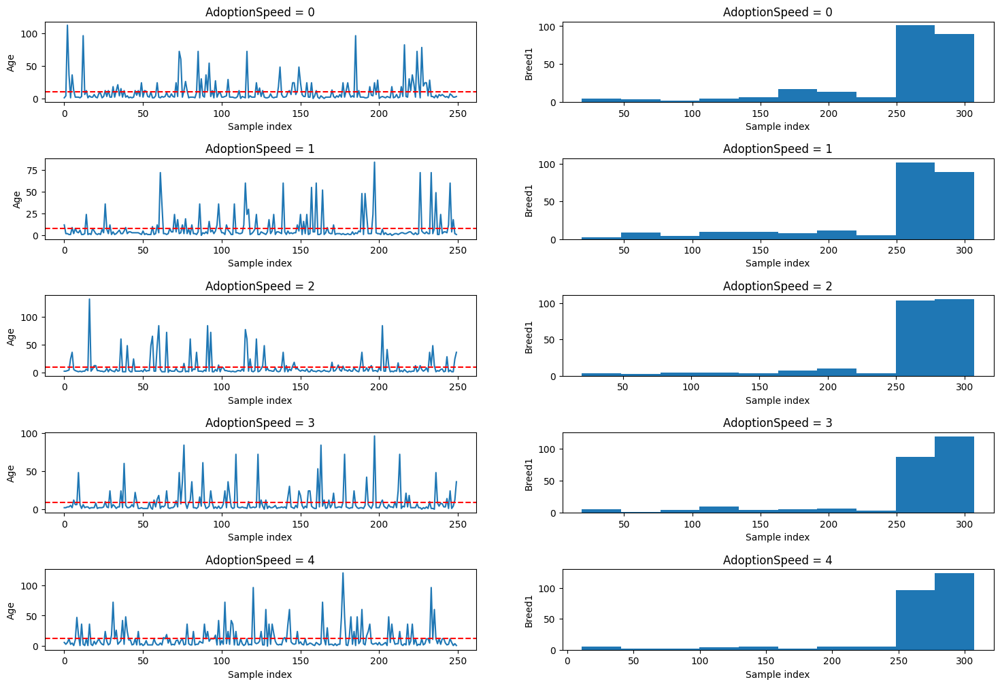

In [ ]:
# Plotting the Age for all classes, taking only 250 shuffled samples
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(18, 12))

for i, ax in enumerate(axes):

  ages = df.Age[df.AdoptionSpeed == i].sample(frac=1)[:250]

  ageAx = ax[0]
  ageAx.plot(range(len(ages)), ages)
  ageAx.set_xlabel("Sample index")
  ageAx.set_ylabel("Age")
  ageAx.set_title(f"AdoptionSpeed = {i}")
  ageAx.axhline(ages.mean(), linestyle="--", color="red")


  breed1 = df.Breed1[df.AdoptionSpeed == i].sample(frac=1)[:250]

  breedAx = ax[1]
  breedAx.hist(breed1)
  breedAx.set_xlabel("Sample index")
  breedAx.set_ylabel("Breed1")
  breedAx.set_title(f"AdoptionSpeed = {i}")

plt.subplots_adjust(hspace=0.7)

/tmp/ipython-input-2211243523.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  mix_ax.set_xticklabels(mix_names, rotation=45, ha="right")
/tmp/ipython-input-2211243523.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  mix_ax.set_xticklabels(mix_names, rotation=45, ha="right")
/tmp/ipython-input-2211243523.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  mix_ax.set_xticklabels(mix_names, rotation=45, ha="right")
/tmp/ipython-input-2211243523.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  mix_ax.set_xticklabels(mix_names, rotation=45, ha="right")
/tmp/ipython-input-2211243523.py:39: UserWarning: set_ticklabels() should only be used with a fi

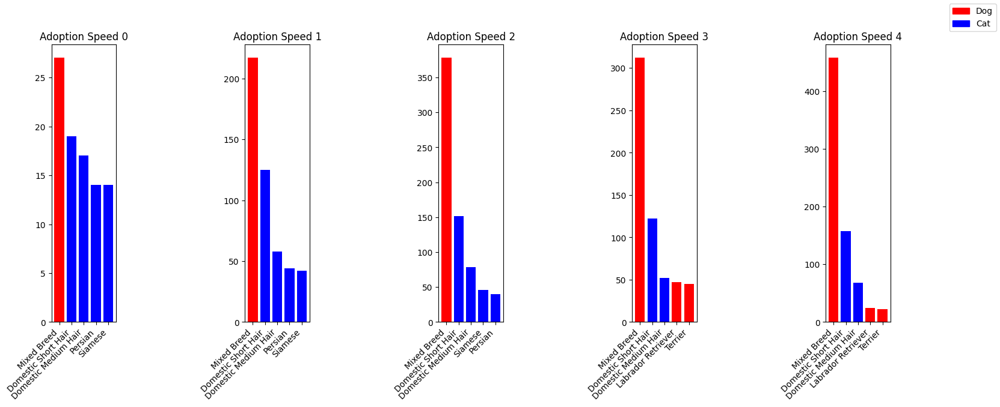

In [ ]:
import matplotlib.patches as mpatches
# Plotting the top 5 most common breed1 for each class, with breed2 = 0 and breed2 != 0

# Load the Breed labels
breed_labels = pd.read_csv("RAF-PetFinder-dataset/Data/breed_labels.csv", index_col=0)

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(18, 6))

top_3_no_mix = {}
top_5_mix = {}

for as_value in sorted(df.AdoptionSpeed.unique()):
  top_3_no_mix[as_value] = df.Breed1[(df.AdoptionSpeed == as_value) & (df.Breed2 == 0)].value_counts().head(3)
  top_5_mix[as_value] = df.Breed1[(df.AdoptionSpeed == as_value) & (df.Breed2 != 0)].value_counts().head(5)

for index, ax in enumerate(axes):
    # Commenting this out because it seems that Breed2 = 0 doesn't guarantee that there won't be mixed breeds
    # no_mix_ax = ax[0]
    mix_ax = ax

    # no_mix_info = top_3_no_mix[index]
    # no_mix_ids = no_mix_info.index
    # no_mix_names = breed_labels.loc[no_mix_ids, "BreedName"].values
    # no_mix_types = breed_labels.loc[no_mix_ids, "Type"].values
    # no_mix_colors = ["red" if t == 1 else "blue" for t in no_mix_types]

    # no_mix_ax.bar(no_mix_names, no_mix_info.values, color=no_mix_colors)
    # no_mix_ax.set_title(f"Adoption Speed {index} — No Mix")


    mix_info = top_5_mix[index]
    mix_ids = mix_info.index
    mix_names = breed_labels.loc[mix_ids, "BreedName"].values
    mix_types = breed_labels.loc[mix_ids, "Type"].values
    mix_colors = ["red" if t == 1 else "blue" for t in mix_types]

    mix_ax.bar(mix_names, mix_info.values, color=mix_colors)
    mix_ax.set_title(f"Adoption Speed {index}")
    mix_ax.set_xticklabels(mix_names, rotation=45, ha="right")
    # no_mix_ax.set_xticklabels(no_mix_names, rotation=45, ha="right")


dog_patch = mpatches.Patch(color='red', label='Dog')
cat_patch = mpatches.Patch(color='blue', label='Cat')
fig.legend(handles=[dog_patch, cat_patch], loc='upper right')
plt.subplots_adjust(wspace=2);
plt.show()

### Plotting the Fee column

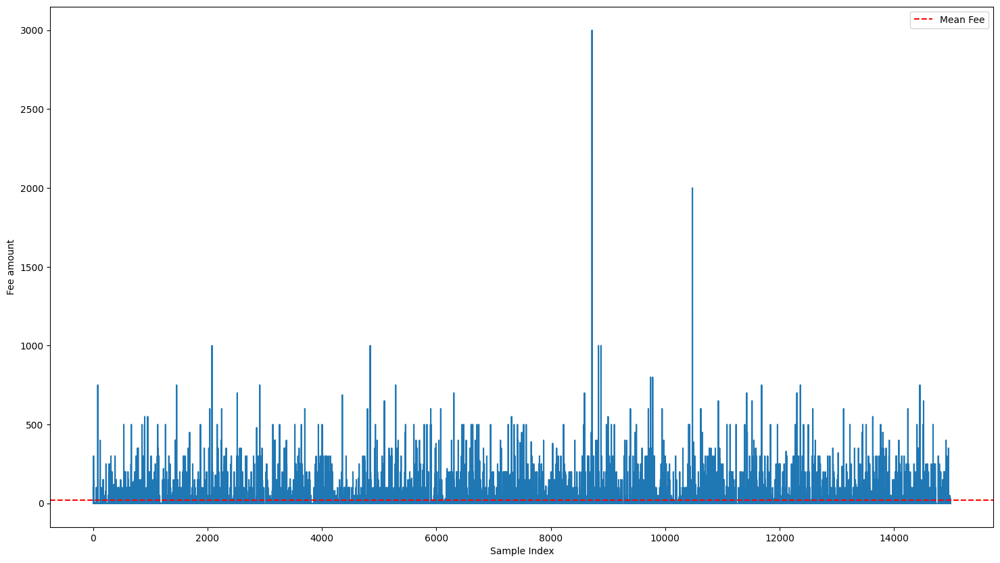

In [ ]:
fig, ax = plt.subplots(figsize=(18, 10))

ax.plot(df.Fee)
ax.set_xlabel("Sample Index")
ax.set_ylabel("Fee amount")

ax.axhline(df.Fee.mean(), linestyle="--", color="red", label="Mean Fee")
ax.legend()




plt.subplots_adjust(hspace=0.5)

## Image Analasys

We will define a function that takes an image an returns a dictionary with variance, skewness, kurtosis for all RGB channels

In [ ]:
from scipy.stats import kurtosis, skew

def image_statistics(image):

    """
    takes an image and returns dictionary with RGB variance, skewness, kurtosis
    """

    stats = {}
    channels = ['R', 'G', 'B']

    for i, ch in enumerate(channels):
        channel = image[:, :, i].flatten()

        stats[f'{ch}_variance'] = np.var(channel)
        stats[f'{ch}_skew'] = skew(channel)
        stats[f'{ch}_kurtosis'] = kurtosis(channel)

    return stats

In [ ]:
# TEST
import matplotlib.image as mpimg

image = mpimg.imread("RAF-PetFinder-dataset/Data/train_images/86e1089a3-1.jpg")

# plt.imshow(image)
stats = image_statistics(image)
stats

{'R_variance': np.float64(5987.071812734563),
 'R_skew': np.float64(0.4082598217030647),
 'R_kurtosis': np.float64(-1.338828874415709),
 'G_variance': np.float64(6008.977069288918),
 'G_skew': np.float64(0.44362837633898766),
 'G_kurtosis': np.float64(-1.2685347497791304),
 'B_variance': np.float64(5989.909908479082),
 'B_skew': np.float64(0.4910104280231775),
 'B_kurtosis': np.float64(-1.18701999830896)}

In [ ]:
def plot_rgb_channels(image):
    """
    Plots the image, the histogram of each RGB channel, and
    bar plots of variance, skewness, and kurtosis for each channel.
    """
    channels = ['Red', 'Green', 'Blue']

    # --- Plot image and RGB histograms ---
    fig, ax = plt.subplots(ncols=4, figsize=(16, 4))
    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    for index, ch in enumerate(channels):
        ax[index + 1].hist(image[:, :, index].flatten(), bins=50, color=ch.lower())
        ax[index + 1].set_title(f"{ch} channel")
        ax[index + 1].set_xlabel("Pixel intensity")
        ax[index + 1].set_ylabel("Count")

    plt.tight_layout()
    plt.show()

    stats = image_statistics(image)

    metrics = ['variance', 'skew', 'kurtosis']
    fig2, ax2 = plt.subplots(ncols=3, figsize=(12, 4))

    for i, metric in enumerate(metrics):
      values = [stats[f'{ch[0]}_{metric}'] for ch in channels]
      ax2[i].barh(channels, values, color=['red', 'green', 'blue'])
      ax2[i].set_title(f"{metric.capitalize()} per channel")
      ax2[i].set_xlabel(metric.capitalize())
      ax2[i].set_ylabel("Channel")
      ax2[i].axvline(x=0, color='black', linestyle='-', linewidth=0.5)  # Add zero line

    plt.tight_layout()
    plt.show()

### Analyzing Single images

AdoptionSpeed: 0, Image 1


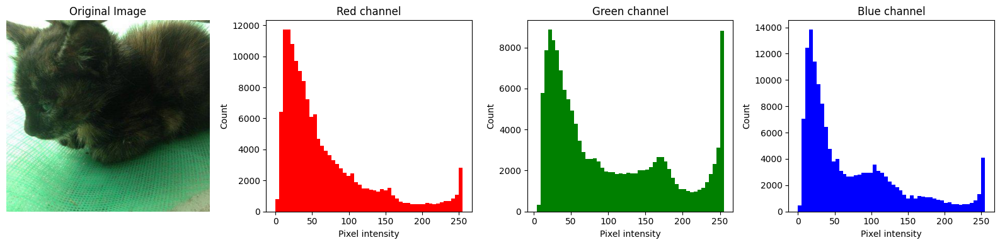

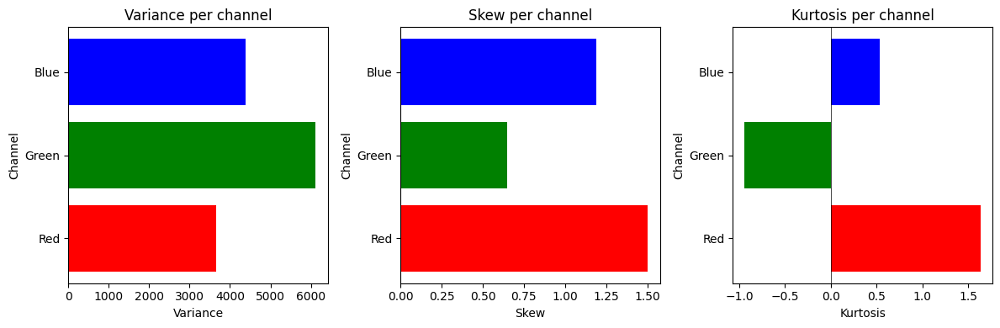

AdoptionSpeed: 0, Image 2


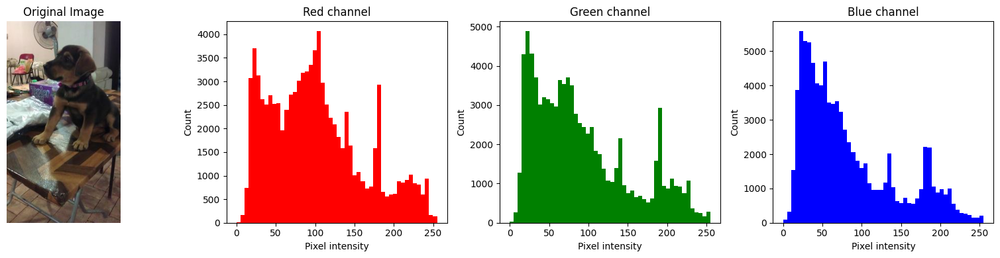

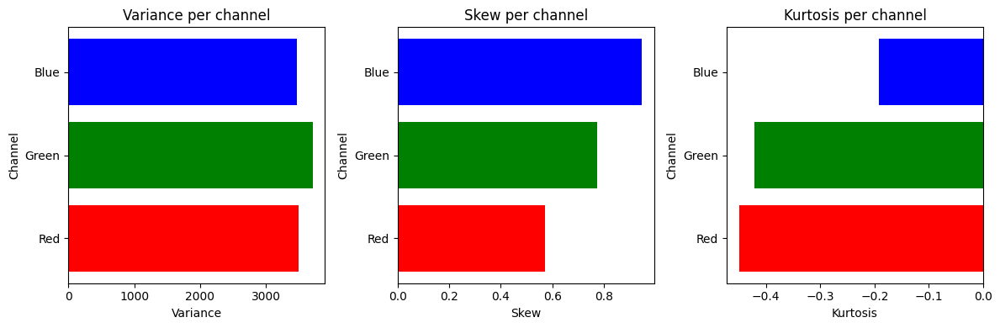

AdoptionSpeed: 0, Image 3


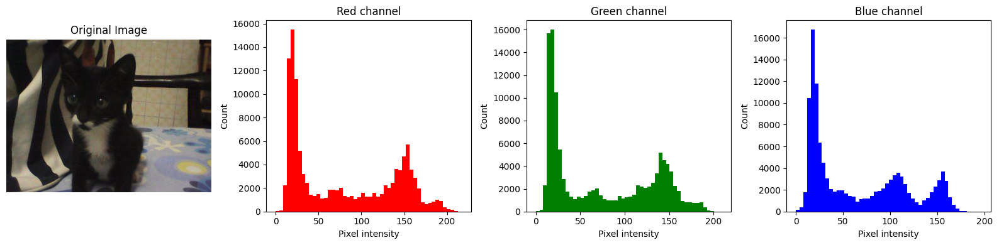

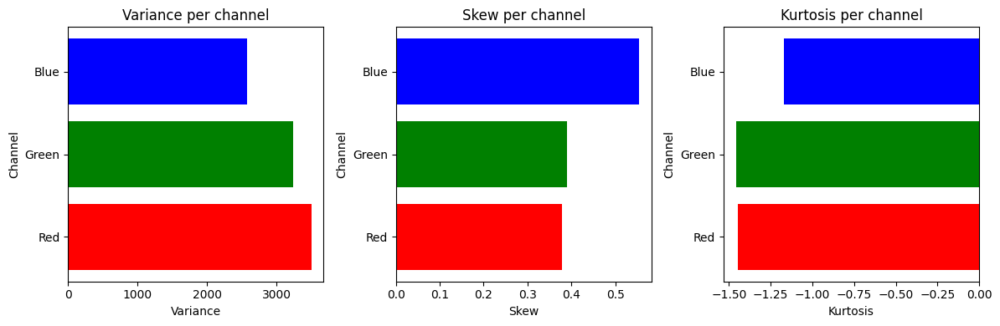

AdoptionSpeed: 1, Image 1


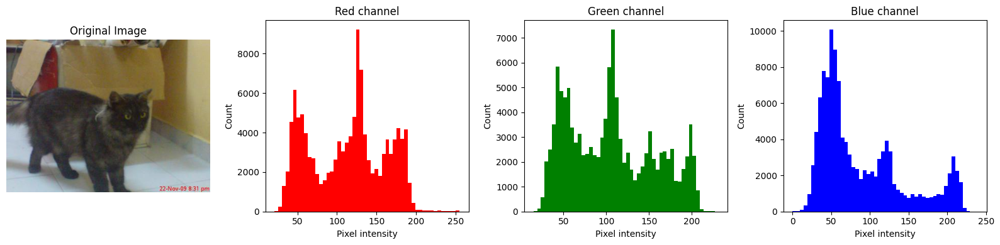

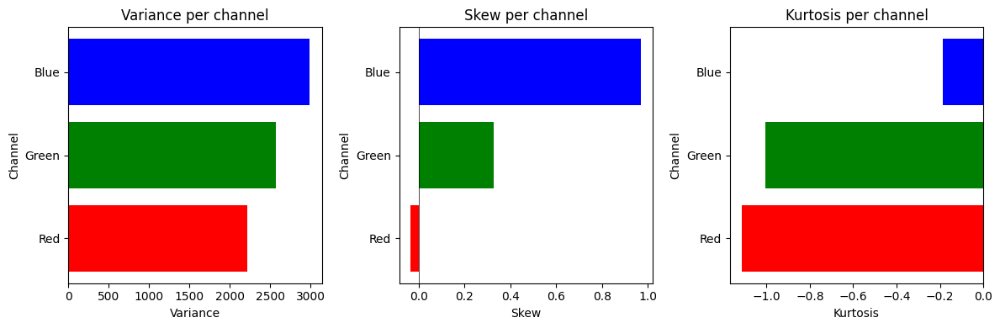

AdoptionSpeed: 1, Image 2


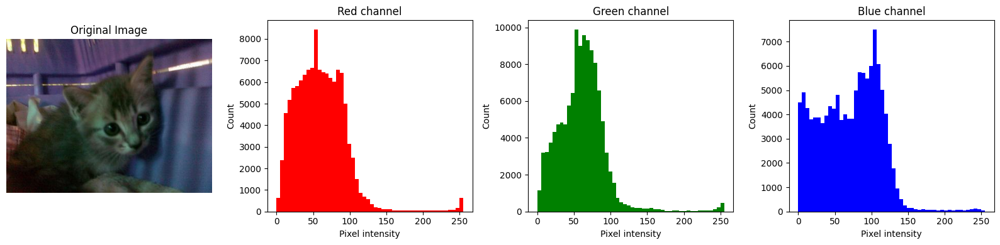

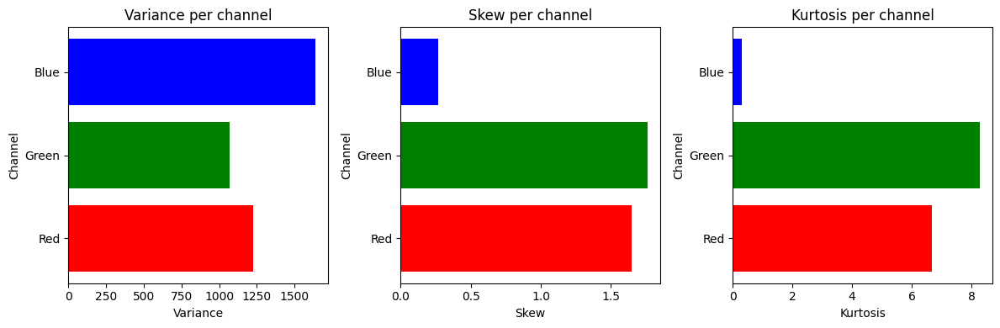

AdoptionSpeed: 1, Image 3


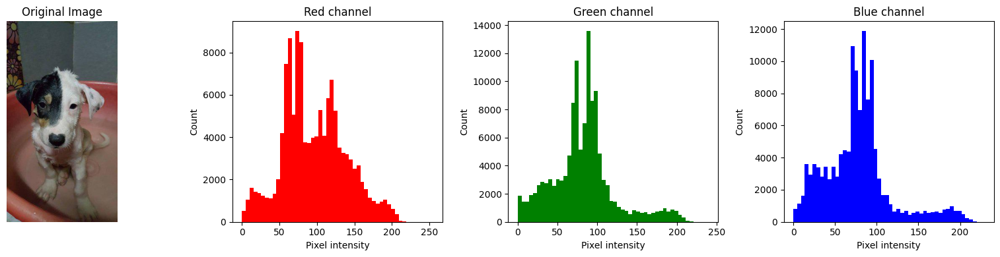

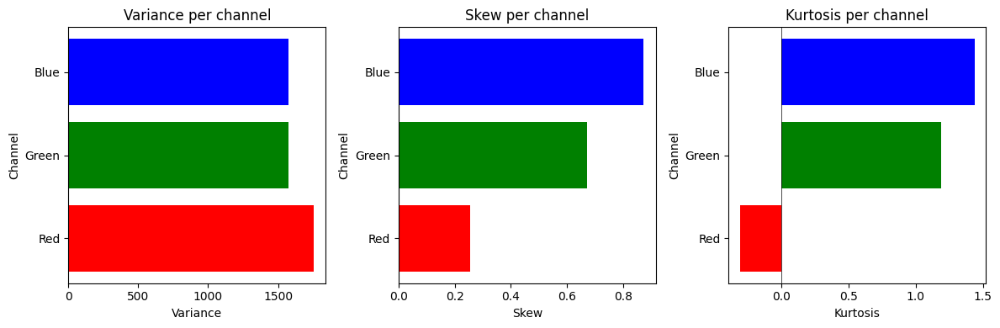

AdoptionSpeed: 2, Image 1


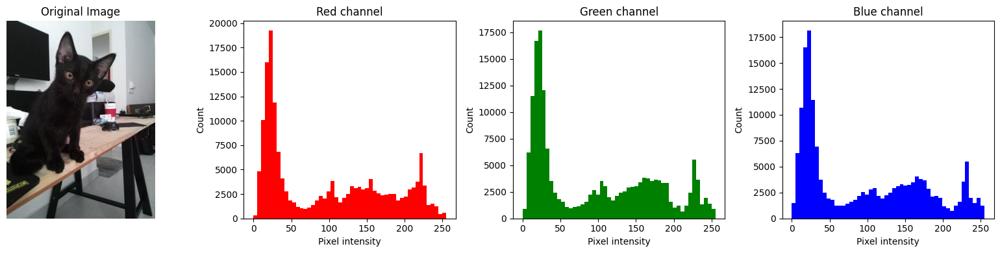

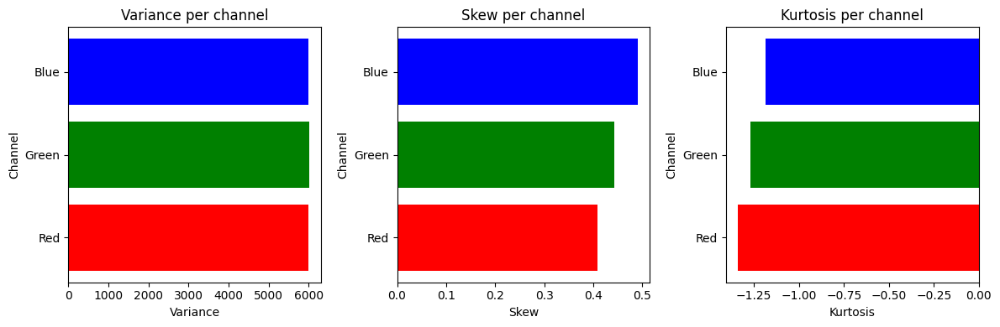

AdoptionSpeed: 2, Image 2


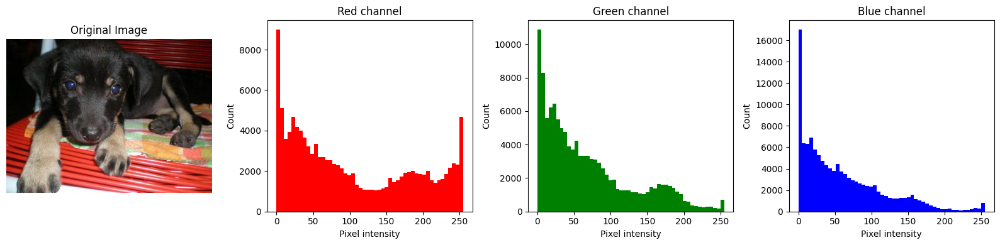

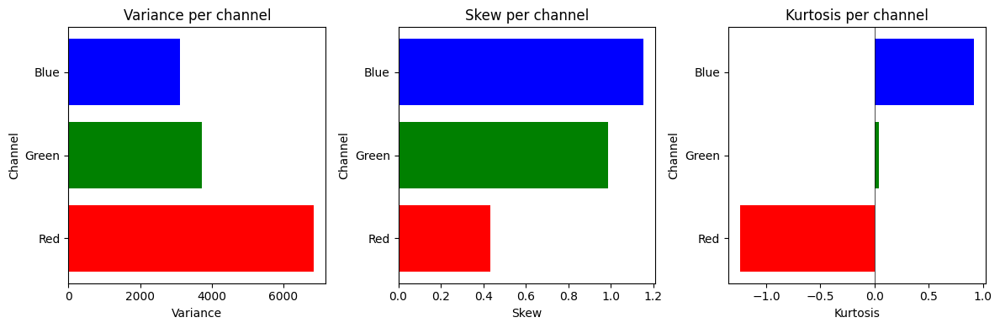

AdoptionSpeed: 2, Image 3


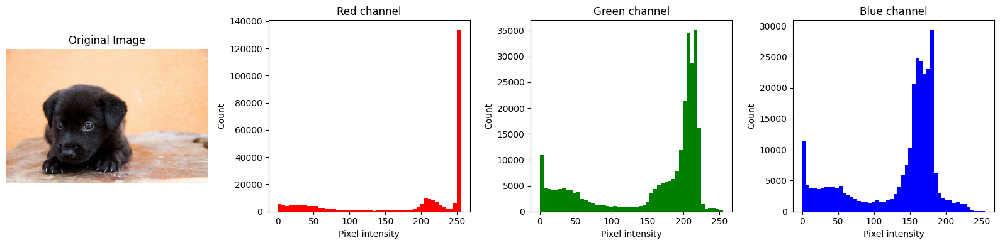

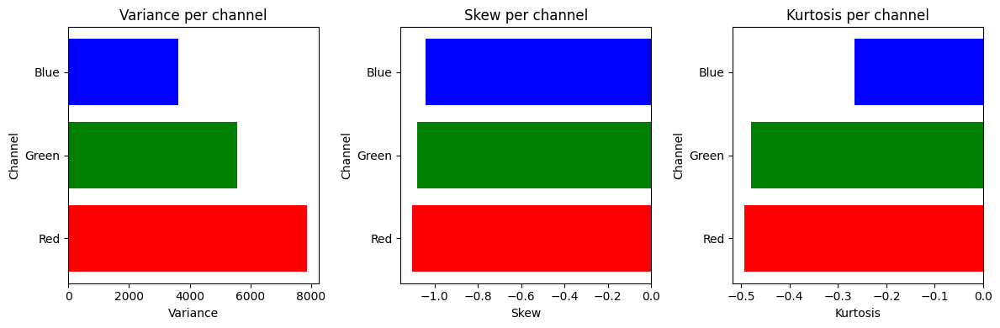

AdoptionSpeed: 3, Image 1


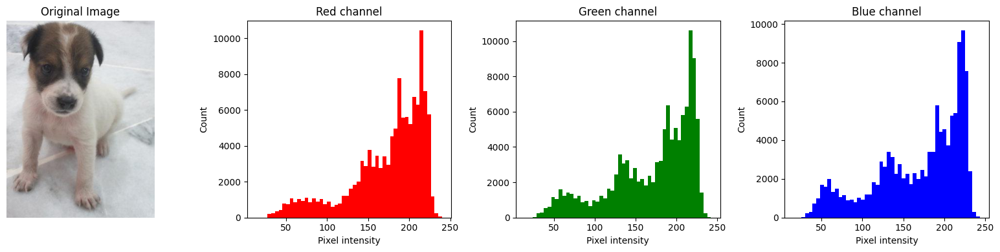

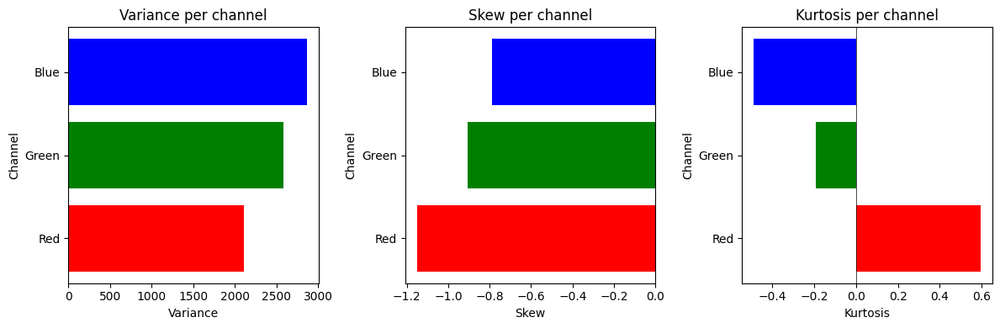

AdoptionSpeed: 3, Image 2


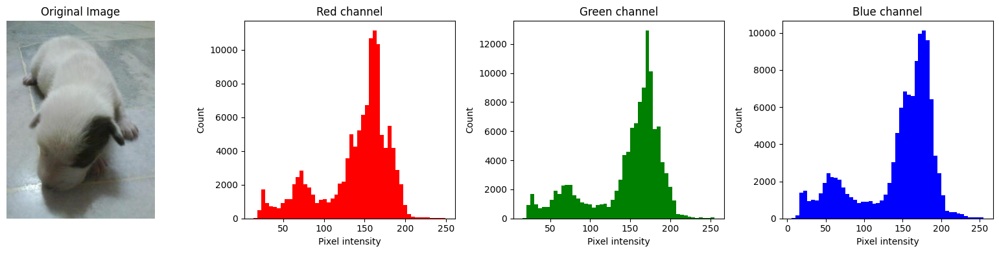

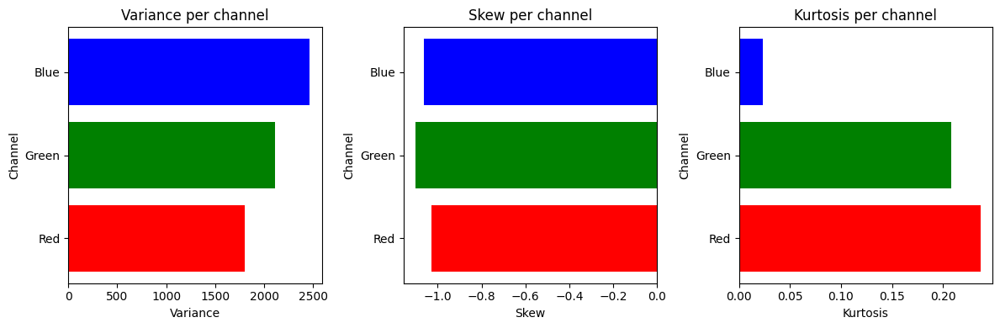

AdoptionSpeed: 3, Image 3


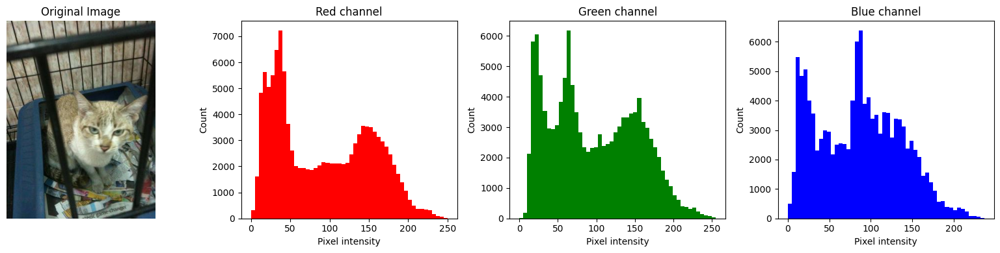

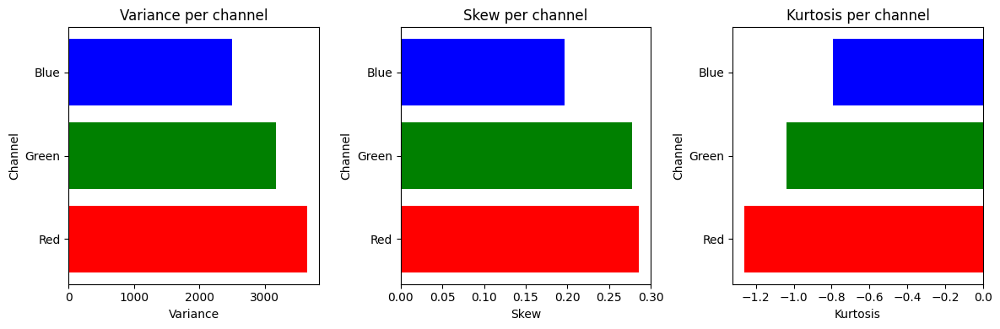

AdoptionSpeed: 4, Image 1


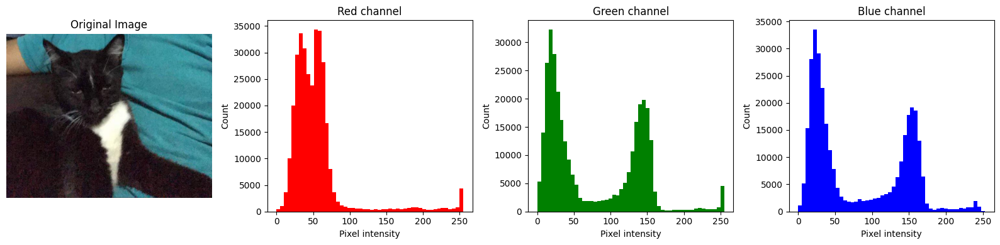

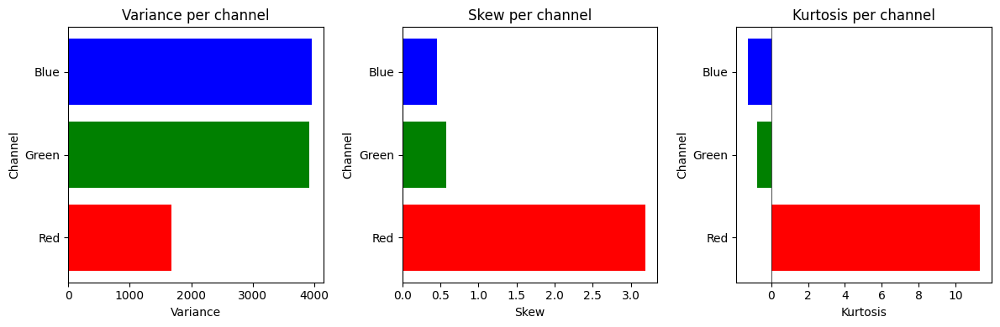

AdoptionSpeed: 4, Image 2


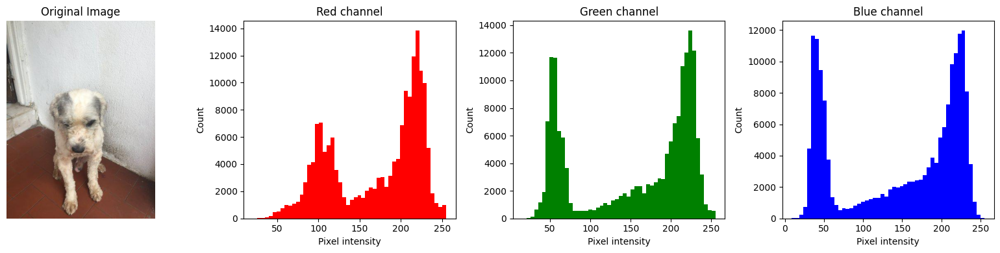

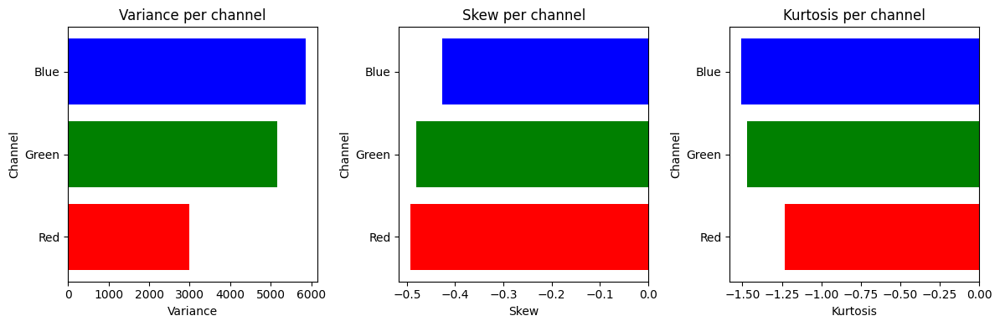

AdoptionSpeed: 4, Image 3


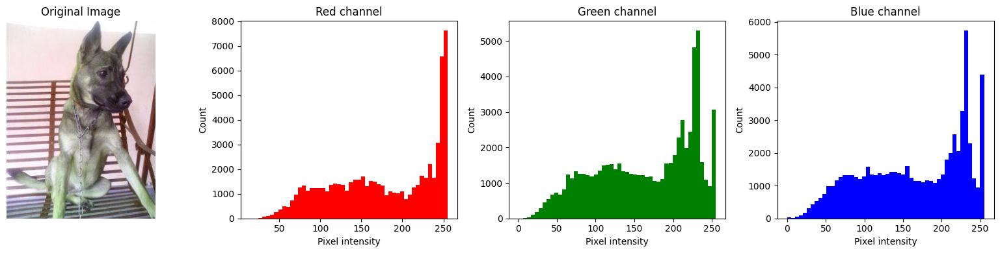

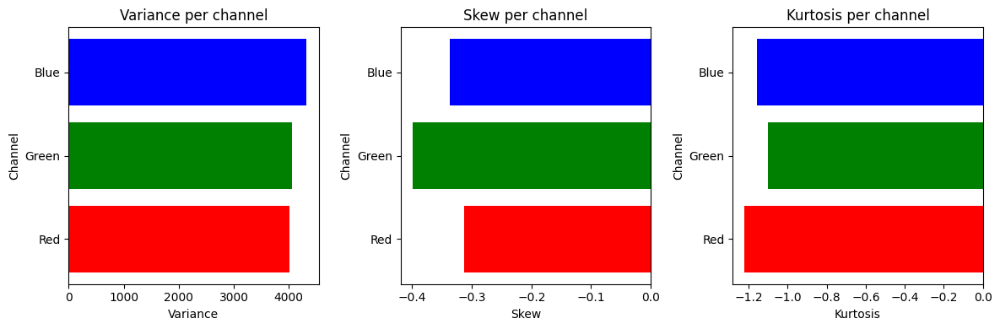

In [ ]:
# Go through all the class labels and plot 3 images per class

for idx, as_value in enumerate(sorted(df.AdoptionSpeed.unique())):
    # Filter dataframe for current AdoptionSpeed value
    subset = df[(df.AdoptionSpeed == as_value) & (df.PhotoAmt > 0)]

    for iteration in range(3):
      id = subset.iloc[iteration].PetID
      img_path = f"RAF-PetFinder-dataset/Data/train_images/{id}-1.jpg"
      img = plt.imread(img_path)

      print(f"AdoptionSpeed: {as_value}, Image {iteration + 1}")
      plot_rgb_channels(img)

### Analyzing the mean Variance, Skew and Kurtosis per RGB channel

In [ ]:
def aggregate_statistics_by_adoption_speed(n_images=250):
    """
    For each AdoptionSpeed value, calculate aggregate statistics across multiple images.
    Returns a dictionary with mean variance, skew, and kurtosis for each channel and adoption speed.
    """
    results = {}

    for as_value in sorted(df.AdoptionSpeed.unique()):
        # Filter dataframe for current AdoptionSpeed value
        subset = df[(df.AdoptionSpeed == as_value) & (df.PhotoAmt > 0)]

        # Limit to n_images (or all available if less)
        n_samples = min(n_images, len(subset))
        subset_sample = subset.iloc[:n_samples]

        # Storage for statistics
        stats_list = {
            'R_variance': [], 'G_variance': [], 'B_variance': [],
            'R_skew': [], 'G_skew': [], 'B_skew': [],
            'R_kurtosis': [], 'G_kurtosis': [], 'B_kurtosis': []
        }

        # Calculate statistics for each image
        for idx, row in subset_sample.iterrows():
            try:
                pet_id = row.PetID
                img_path = f"RAF-PetFinder-dataset/Data/train_images/{pet_id}-1.jpg"
                img = plt.imread(img_path)

                # Get statistics for this image
                img_stats = image_statistics(img)

                # Append to lists
                for key in stats_list.keys():
                    stats_list[key].append(img_stats[key])

            except Exception as e:
                print(f"Error loading image for PetID {pet_id}: {e}")
                continue

        # Calculate mean statistics
        results[as_value] = {
            key: np.mean(values) for key, values in stats_list.items()
        }
        results[as_value]['n_images'] = len(stats_list['R_variance'])

        print(f"AdoptionSpeed {as_value}: Processed {results[as_value]['n_images']} images")

    return results

In [ ]:
results = aggregate_statistics_by_adoption_speed()
results

AdoptionSpeed 0: Processed 250 images
AdoptionSpeed 1: Processed 250 images
AdoptionSpeed 2: Processed 250 images
AdoptionSpeed 3: Processed 250 images
AdoptionSpeed 4: Processed 250 images


{np.int64(0): {'R_variance': np.float64(3380.0841507077616),
  'G_variance': np.float64(3450.7878404741687),
  'B_variance': np.float64(3472.150688018428),
  'R_skew': np.float64(-0.06777221887438492),
  'G_skew': np.float64(0.09453322755674701),
  'B_skew': np.float64(0.2574223686190087),
  'R_kurtosis': np.float64(-0.29421410333975573),
  'G_kurtosis': np.float64(-0.4347641432248948),
  'B_kurtosis': np.float64(-0.3525779429462333),
  'n_images': 250},
 np.int64(1): {'R_variance': np.float64(3536.903099201898),
  'G_variance': np.float64(3556.674796332336),
  'B_variance': np.float64(3576.677009486445),
  'R_skew': np.float64(-0.11773411763750392),
  'G_skew': np.float64(0.05270524071791929),
  'B_skew': np.float64(0.1991403358994497),
  'R_kurtosis': np.float64(-0.4293484026332296),
  'G_kurtosis': np.float64(-0.47845241965839824),
  'B_kurtosis': np.float64(-0.5194957099022182),
  'n_images': 250},
 np.int64(2): {'R_variance': np.float64(3646.001810145176),
  'G_variance': np.float

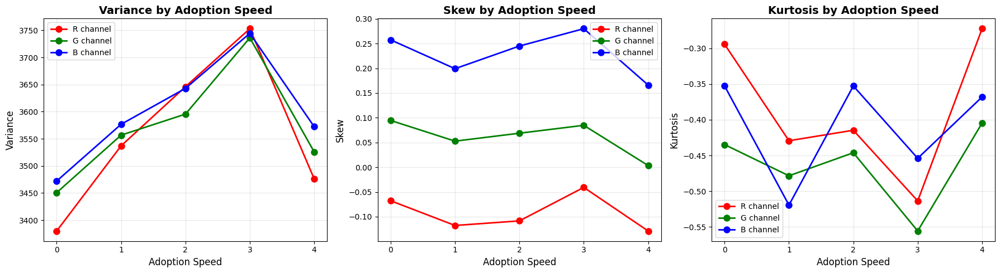

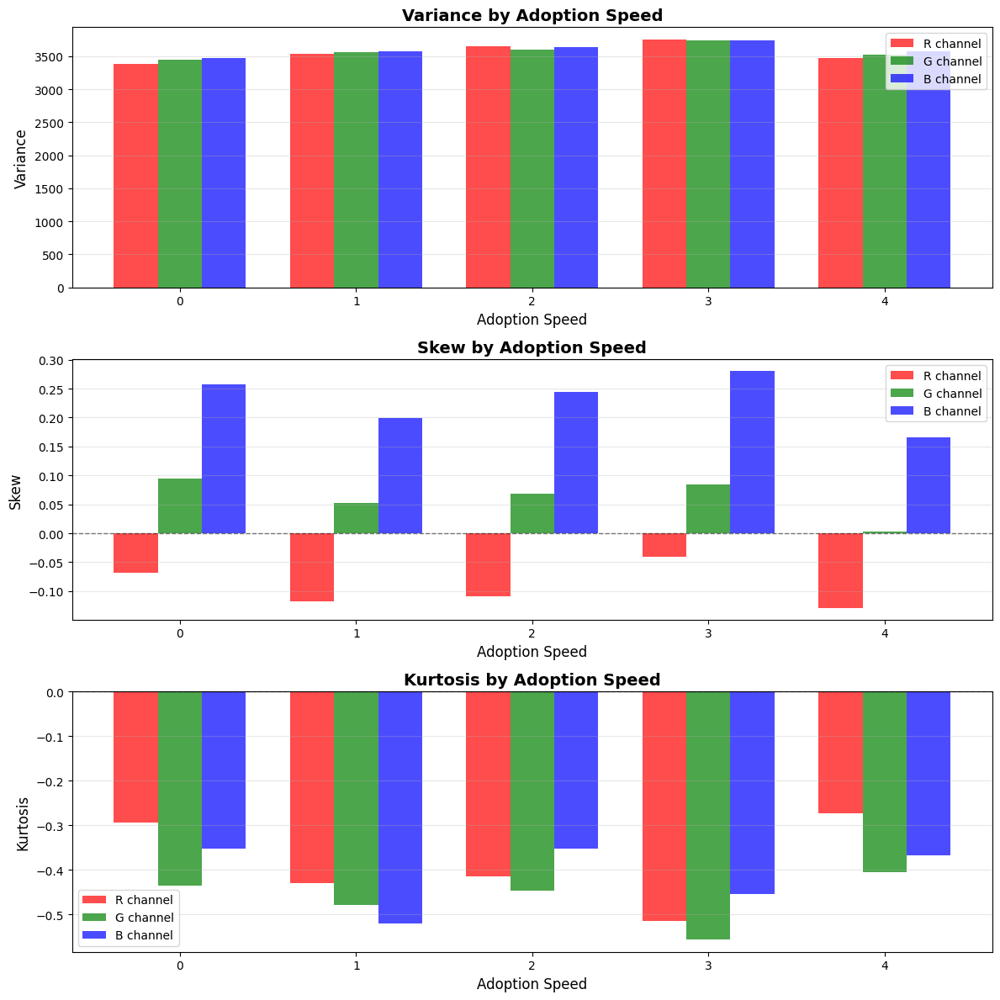

In [ ]:
# Lets plot the result data

adoption_speeds = sorted(results.keys())
channels = ['R', 'G', 'B']
metrics = ['variance', 'skew', 'kurtosis']
colors = ['red', 'green', 'blue']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

for idx, metric in enumerate(metrics):
    ax = axes[idx]

    for ch, color in zip(channels, colors):
        values = [results[as_val][f'{ch}_{metric}'] for as_val in adoption_speeds]
        ax.plot(adoption_speeds, values, marker='o', label=f'{ch} channel',
                color=color, linewidth=2, markersize=8)

    ax.set_xlabel('Adoption Speed', fontsize=12)
    ax.set_ylabel(metric.capitalize(), fontsize=12)
    ax.set_title(f'{metric.capitalize()} by Adoption Speed', fontsize=14, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xticks(adoption_speeds)

plt.tight_layout()
plt.show()

fig2, axes2 = plt.subplots(nrows=3, ncols=1, figsize=(12, 12))

x = np.arange(len(adoption_speeds))
width = 0.25

for idx, metric in enumerate(metrics):
    ax = axes2[idx]

    for i, (ch, color) in enumerate(zip(channels, colors)):
        values = [results[as_val][f'{ch}_{metric}'] for as_val in adoption_speeds]
        ax.bar(x + i * width, values, width, label=f'{ch} channel', color=color, alpha=0.7)

    ax.set_xlabel('Adoption Speed', fontsize=12)
    ax.set_ylabel(metric.capitalize(), fontsize=12)
    ax.set_title(f'{metric.capitalize()} by Adoption Speed', fontsize=14, fontweight='bold')
    ax.set_xticks(x + width)
    ax.set_xticklabels(adoption_speeds)
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')

    if metric in ['skew', 'kurtosis']:
        ax.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)

plt.tight_layout()
plt.show()



## Designin the model

We will create 3 models that take both tabular data and images, where the
architecture of each model will differ

#`Model1` will be the most simple
#`Model2` will have the most most layers - expected to do the best
#`Model3` is experimental with Attention Fusion

In [6]:
# Importing PyTorch

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from torch.utils.tensorboard import SummaryWriter
from sklearn.preprocessing import StandardScaler
import os


In [7]:
pip install tensorboard

In [29]:
# Creating SummaryWriter
writer = SummaryWriter('runs/adoption-speed')

### Model 1

In [9]:
class Model1_EarlyFusion_Multiclass(nn.Module):
    def __init__(self, n_tab_features, num_classes=5, img_size=128):
        super().__init__()

        # Image Branch
        self.cnn = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128 → 64

            # Block 2
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 64 → 32

            # Block 3
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 32 → 16

            nn.Flatten()
        )

        # Calculate CNN output size
        spatial_size = img_size // 8  # 3 pooling layers
        cnn_output_size = 128 * spatial_size * spatial_size

        # Tabular branch
        self.tab_fc = nn.Sequential(
            nn.Linear(n_tab_features, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.2)
        )

        # Fusion layer
        self.fc = nn.Sequential(
            nn.Linear(cnn_output_size + 32, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, img, tab):
        img_feat = self.cnn(img)
        tab_feat = self.tab_fc(tab)
        fused = torch.cat([img_feat, tab_feat], dim=1)
        return self.fc(fused)

### Model 2

In [10]:
class Model2_DeepFusion_Multiclass(nn.Module):
    def __init__(self, n_tab_features, num_classes=5, img_size=128):
        super().__init__()

        self.cnn = nn.Sequential(
            # Block 1: Double conv
            nn.Conv2d(3, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128 → 64

            # Block 2: Double conv
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 64 → 32

            # Block 3: Double conv
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 32 → 16

            nn.Flatten()
        )

        # Dynamic output size calculation
        with torch.no_grad():
            example = torch.randn(1, 3, img_size, img_size)
            cnn_output_size = self.cnn(example).shape[1]

        # --- TABULAR BRANCH ---
        self.tab_fc = nn.Sequential(
            nn.Linear(n_tab_features, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Dropout(0.3)
        )

        # --- FUSION LAYER ---
        # CRITICAL FIX: Output num_classes, NO Sigmoid
        self.classifier = nn.Sequential(
            nn.Linear(cnn_output_size + 64, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)  # Raw logits for CrossEntropyLoss
        )

    def forward(self, img, tab):
        img_feat = self.cnn(img)
        tab_feat = self.tab_fc(tab)
        fused = torch.cat([img_feat, tab_feat], dim=1)
        return self.classifier(fused)  # Returns (batch_size, num_classes)

### Model 3

In [11]:
class AttentionFusion(nn.Module):
    """Cross-attention mechanism for tabular-to-image attention"""
    def __init__(self, dim_img, dim_tab, hidden_dim=128):
        super().__init__()
        self.query = nn.Linear(dim_tab, hidden_dim)
        self.key = nn.Linear(dim_img, hidden_dim)
        self.value = nn.Linear(dim_img, hidden_dim)
        self.scale = hidden_dim ** -0.5

    def forward(self, img_feat, tab_feat):
        """
        img_feat: (batch, dim_img)
        tab_feat: (batch, dim_tab)
        """
        Q = self.query(tab_feat).unsqueeze(1)     # (batch, 1, hidden)
        K = self.key(img_feat).unsqueeze(1)       # (batch, 1, hidden)
        V = self.value(img_feat).unsqueeze(1)     # (batch, 1, hidden)

        # Scaled dot-product attention
        att_scores = (Q @ K.transpose(-2, -1)) * self.scale  # (batch, 1, 1)
        att_weights = torch.softmax(att_scores, dim=-1)

        attended = (att_weights @ V).squeeze(1)   # (batch, hidden)
        return attended


class Model3_AttentionFusion_Multiclass(nn.Module):
    def __init__(self, n_tab_features, num_classes=5, img_size=128):
        super().__init__()

        # --- IMAGE BRANCH (Deeper CNN) ---
        self.cnn = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128 → 64

            # Block 2
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 64 → 32

            # Block 3
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 32 → 16

            nn.Flatten()
        )

        # Dynamic CNN output size
        with torch.no_grad():
            example = torch.randn(1, 3, img_size, img_size)
            cnn_dim = self.cnn(example).shape[1]

        # Tabular branch
        self.tab_fc = nn.Sequential(
            nn.Linear(n_tab_features, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3)
        )

        # Attention fusion
        self.attention = AttentionFusion(cnn_dim, 64, hidden_dim=128)


        # Input: attended features (128) + original tab features (64) = 192
        self.classifier = nn.Sequential(
            nn.Linear(128 + 64, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)  # Raw logits
        )

    def forward(self, img, tab):
        img_feat = self.cnn(img)
        tab_feat = self.tab_fc(tab)

        # Apply attention: tab queries image
        attended_img = self.attention(img_feat, tab_feat)

        # Fuse attended image features with tabular features
        fused = torch.cat([attended_img, tab_feat], dim=1)

        return self.classifier(fused)

## Preparing the data and splitting

In [13]:
# Drop the columns that aren't needed
data = df.drop(columns=['RescuerID','State','VideoAmt','Description','Name'])

In [14]:
# Shuffle the data
# We will take 2500 -> 2000 for training and  500 for test
# There will be more entries as we will try to take up to 3 images per profile
data = data.sample(frac=1, random_state=10823).reset_index(drop=True)

train_sample = {'counter': 0, 'tab_data': [], 'images_path': [], 'labels': []}
test_sample  = {'counter': 0, 'tab_data': [], 'images_path': [], 'labels': []}

def get_images_from_pet_id(pet_id, number_of_images):
    images = []
    max_num = min(number_of_images, 3)
    for i in range(1, max_num + 1):
        img_path = f"RAF-PetFinder-dataset/Data/train_images/{pet_id}-{i}.jpg"
        images.append(img_path)
    return images
def create_train_test_samples(train_samples_num=2000, test_samples_num=500):
  for index, row in data.iterrows():
      if train_sample['counter'] >= 2000 and test_sample['counter'] >= 500:
          break

      number_of_images = row.PhotoAmt
      if number_of_images == 0:
          continue

      images = get_images_from_pet_id(row.PetID, int(number_of_images))

      if train_sample['counter'] < 2000:
          sample_object = train_sample
      elif test_sample['counter'] < 500:
          sample_object = test_sample
      else:
          break

      for img in images:
          tab_row = row.drop(["AdoptionSpeed", "PetID"]).values
          sample_object['tab_data'].append(tab_row)
          sample_object['images_path'].append(img)
          sample_object['labels'].append(row.AdoptionSpeed)

      sample_object['counter'] += 1

create_train_test_samples()

In [15]:
train_sample["tab_data"][0]

array([1, 1, 307, 0, 2, 1, 0, 0, 2, 2, 2, 2, 2, 1, 1, 0, 1.0, 0.2, 0.2],
      dtype=object)

In [16]:
train_sample["images_path"][0]

'RAF-PetFinder-dataset/Data/train_images/6c3a05812-1.jpg'

In [17]:
train_sample['labels'][0]

3

### Creating custom Dataset class

In [18]:
class MultimodalDataset(Dataset):
    def __init__(self, images_paths, tab_data, labels, img_size=128,
                 scaler=None, is_train=True):
        self.images_paths = images_paths
        self.tab_data = tab_data
        self.labels = labels
        self.is_train = is_train

        # Image transforms
        # Resize to be consistent shape
        # Flip, rotate and add change
        if is_train:
            self.img_transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.RandomHorizontalFlip(0.5),
                transforms.RandomRotation(15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                   std=[0.229, 0.224, 0.225])
            ])
        else:
            self.img_transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                   std=[0.229, 0.224, 0.225])
            ])

        # Tabular data preprocessing
        # Turn to np array with float values
        self.tab_data = np.array(tab_data, dtype=np.float32)

        # Fit or transform scaler
        # Get scalar in training and then in validation to the same scalar
        if is_train:
            self.scaler = StandardScaler()
            self.tab_data = self.scaler.fit_transform(self.tab_data)
        else:
            self.scaler = scaler
            self.tab_data = self.scaler.transform(self.tab_data)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Load and transform image
        img = Image.open(self.images_paths[idx]).convert('RGB')
        img = self.img_transform(img)

        # Get tabular data
        tab = torch.FloatTensor(self.tab_data[idx])

        # Get label
        label = torch.LongTensor([self.labels[idx]])[0]

        return img, tab, label


### Initializing Datasets and Dataloaders

In [19]:
# Create datasets
train_dataset = MultimodalDataset(
    train_sample['images_path'],
    train_sample['tab_data'],
    train_sample['labels'],
    is_train=True
)

test_dataset = MultimodalDataset(
    test_sample['images_path'],
    test_sample['tab_data'],
    test_sample['labels'],
    scaler=train_dataset.scaler, # Here we are using the scalar from the train
    is_train=False
)

In [20]:
# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

## Creating helper functions for training and testing

In [21]:
# Create a function for a single training epoch
def train_epoch(model, loader, criterion, optimizer, device):
    """
    Function thakes

    model - DL model we created
    loader - the loaded data - train data,
    criterion - on what metric to evaluate
    optimizer - we use Adam
    device - should be cuda (gpu)

    Returns accuracy and loss
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for img, tab, labels in loader:
        img, tab, labels = img.to(device), tab.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(img, tab)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()


        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    return running_loss / len(loader), 100 * correct / total


In [22]:
# We created a function to evaluate or model
def validate(model, loader, criterion, device):
    """
    Function takes

    model to evaluate,
    loader - the data - test data,
    criterion - for calulating the losso

    and returns the evaluation
    """
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for img, tab, labels in loader:
            img, tab, labels = img.to(device), tab.to(device), labels.to(device)

            outputs = model(img, tab)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return running_loss / len(loader), 100 * correct / total

In [33]:
# This function will be used to train and evaluate or model
def train_model(model_class, n_epochs=20, modelname="default"):
    """
    Takes only the DL model that should be trained and evaluated
    """

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")


    # Initialize model
    n_tab_features = train_sample['tab_data'][0].shape[0]
    num_of_classes = 5 # 0, 1, 2, 3, 4
    model = model_class(n_tab_features, num_of_classes).to(device)

    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                      factor=0.5, patience=5)

    for epoch in range(n_epochs):
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_acc = validate(model, test_loader, criterion, device)

        writer.add_scalar(f'{modelname}-Loss/train', train_loss, epoch)
        writer.add_scalar(f'{modelname}-Accuracy/val', val_acc, epoch)

        scheduler.step(val_loss)

        print(f"Epoch {epoch+1}/{n_epochs}")
        print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"  Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    writer.close()
    return model

### Model 1 experiment

In [34]:
model1 = train_model(Model1_EarlyFusion_Multiclass, n_epochs=10, modelname="Model1")

Using device: cuda
Epoch 1/10
  Train Loss: 1.7400 | Train Acc: 25.27%
  Val Loss: 1.4890 | Val Acc: 24.77%
Epoch 2/10
  Train Loss: 1.5082 | Train Acc: 28.12%
  Val Loss: 1.4659 | Val Acc: 26.11%
Epoch 3/10
  Train Loss: 1.4933 | Train Acc: 28.41%
  Val Loss: 1.4648 | Val Acc: 26.11%
Epoch 4/10
  Train Loss: 1.4750 | Train Acc: 28.78%
  Val Loss: 1.4636 | Val Acc: 26.11%
Epoch 5/10
  Train Loss: 1.4630 | Train Acc: 29.28%
  Val Loss: 1.4569 | Val Acc: 26.11%
Epoch 6/10
  Train Loss: 1.4627 | Train Acc: 29.36%
  Val Loss: 1.4549 | Val Acc: 26.11%
Epoch 7/10
  Train Loss: 1.4627 | Train Acc: 29.71%
  Val Loss: 1.4557 | Val Acc: 26.11%
Epoch 8/10
  Train Loss: 1.4626 | Train Acc: 29.32%
  Val Loss: 1.4559 | Val Acc: 26.11%
Epoch 9/10
  Train Loss: 1.4642 | Train Acc: 28.80%
  Val Loss: 1.4559 | Val Acc: 26.11%
Epoch 10/10
  Train Loss: 1.4630 | Train Acc: 29.46%
  Val Loss: 1.4558 | Val Acc: 26.11%


### Model 2 Experiment

In [35]:
model2 = train_model(Model2_DeepFusion_Multiclass, modelname="Model2", n_epochs=15)

Using device: cuda
Epoch 1/15
  Train Loss: 2.2728 | Train Acc: 24.84%
  Val Loss: 1.4658 | Val Acc: 26.19%
Epoch 2/15
  Train Loss: 1.5231 | Train Acc: 28.05%
  Val Loss: 1.4626 | Val Acc: 26.02%
Epoch 3/15
  Train Loss: 1.5009 | Train Acc: 28.55%
  Val Loss: 1.4553 | Val Acc: 25.44%
Epoch 4/15
  Train Loss: 1.5004 | Train Acc: 28.90%
  Val Loss: 1.4820 | Val Acc: 26.11%
Epoch 5/15
  Train Loss: 1.4935 | Train Acc: 29.32%
  Val Loss: 1.4659 | Val Acc: 26.11%
Epoch 6/15
  Train Loss: 1.4875 | Train Acc: 29.28%
  Val Loss: 1.4865 | Val Acc: 27.27%
Epoch 7/15
  Train Loss: 1.4759 | Train Acc: 28.90%
  Val Loss: 1.4552 | Val Acc: 29.86%
Epoch 8/15
  Train Loss: 1.4717 | Train Acc: 30.21%
  Val Loss: 1.4525 | Val Acc: 29.77%
Epoch 9/15
  Train Loss: 1.4641 | Train Acc: 30.89%
  Val Loss: 1.4438 | Val Acc: 30.19%
Epoch 10/15
  Train Loss: 1.4534 | Train Acc: 31.64%
  Val Loss: 1.4379 | Val Acc: 30.61%
Epoch 11/15
  Train Loss: 1.4539 | Train Acc: 31.41%
  Val Loss: 1.4549 | Val Acc: 26.11%


### Model 3 Experiment

In [36]:
model3 = train_model(Model3_AttentionFusion_Multiclass, modelname="Model3", n_epochs=10)

Using device: cuda
Epoch 1/10
  Train Loss: 1.5984 | Train Acc: 25.79%
  Val Loss: 1.4611 | Val Acc: 25.69%
Epoch 2/10
  Train Loss: 1.5058 | Train Acc: 27.99%
  Val Loss: 1.4741 | Val Acc: 26.11%
Epoch 3/10
  Train Loss: 1.4927 | Train Acc: 27.56%
  Val Loss: 1.4615 | Val Acc: 26.11%
Epoch 4/10
  Train Loss: 1.4815 | Train Acc: 28.18%
  Val Loss: 1.4581 | Val Acc: 26.11%
Epoch 5/10
  Train Loss: 1.4811 | Train Acc: 28.72%
  Val Loss: 1.4621 | Val Acc: 26.11%
Epoch 6/10
  Train Loss: 1.4688 | Train Acc: 28.99%
  Val Loss: 1.4575 | Val Acc: 26.11%
Epoch 7/10
  Train Loss: 1.4649 | Train Acc: 29.21%
  Val Loss: 1.4560 | Val Acc: 26.11%
Epoch 8/10
  Train Loss: 1.4616 | Train Acc: 29.42%
  Val Loss: 1.4551 | Val Acc: 26.11%
Epoch 9/10
  Train Loss: 1.4630 | Train Acc: 29.42%
  Val Loss: 1.4559 | Val Acc: 26.11%
Epoch 10/10
  Train Loss: 1.4642 | Train Acc: 29.42%
  Val Loss: 1.4549 | Val Acc: 26.11%


In [32]:
pd.DataFrame(train_sample["labels"]).value_counts()

,count
0,
2,1419
4,1249
3,1076
1,954
0,125


In [31]:
pd.DataFrame(test_sample["labels"]).value_counts()

,count
0,
2,313
4,309
3,284
1,271
0,22


4833

In [37]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [38]:
%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 64993), started 0:24:04 ago. (Use '!kill 64993' to kill it.)

<IPython.core.display.Javascript object>